In [1]:
%matplotlib inline

# Can I detect and predict facial keypoints?
(or dealing with images)

My project for the remote course "Machine Learning" at SoftUni

tuitor: Yordan Darakchiev 

august - november 2022

## 1. Data processing
### 1.1. Importing nesseccery libraries

In [180]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.impute import SimpleImputer
from sklearn. preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.cluster import DBSCAN, KMeans

### 1.2. Reading and exploaring data

Retrieveing data as pd.DataFrame and taking first view into datasets:

In [3]:
X_train = pd.read_csv('training.csv')
X_train.shape # (7049, 31)

# Display first 3 rows(observations) transposed
X_train.head(3).T

,0,1,2
left_eye_center_x,66.033564,64.332936,65.057053
left_eye_center_y,39.002274,34.970077,34.909642
right_eye_center_x,30.227008,29.949277,30.903789
right_eye_center_y,36.421678,33.448715,34.909642
left_eye_inner_corner_x,59.582075,58.85617,59.412
left_eye_inner_corner_y,39.647423,35.274349,36.320968
left_eye_outer_corner_x,73.130346,70.722723,70.984421
left_eye_outer_corner_y,39.969997,36.187166,36.320968
right_eye_inner_corner_x,36.356571,36.034723,37.678105
right_eye_inner_corner_y,37.389402,34.361532,36.320968


In [105]:
# X_train.dropna()  # 2140 rows × 32 columns
X_train.dropna(thresh = 2)  

,left_eye_center_x,left_eye_center_y,right_eye_center_x,right_eye_center_y,left_eye_inner_corner_x,left_eye_inner_corner_y,left_eye_outer_corner_x,left_eye_outer_corner_y,right_eye_inner_corner_x,right_eye_inner_corner_y,...,mouth_left_corner_x,mouth_left_corner_y,mouth_right_corner_x,mouth_right_corner_y,mouth_center_top_lip_x,mouth_center_top_lip_y,mouth_center_bottom_lip_x,mouth_center_bottom_lip_y,Image,Image_num
0,66.033564,39.002274,30.227008,36.421678,59.582075,39.647423,73.130346,39.969997,36.356571,37.389402,...,61.195308,79.970165,28.614496,77.388992,43.312602,72.935459,43.130707,84.485774,238 236 237 238 240 240 239 241 241 243 240 23...,"[[238, 236, 237, 238, 240, 240, 239, 241, 241,..."
1,64.332936,34.970077,29.949277,33.448715,58.856170,35.274349,70.722723,36.187166,36.034723,34.361532,...,56.421447,76.352000,35.122383,76.047660,46.684596,70.266553,45.467915,85.480170,219 215 204 196 204 211 212 200 180 168 178 19...,"[[219, 215, 204, 196, 204, 211, 212, 200, 180,..."
2,65.057053,34.909642,30.903789,34.909642,59.412000,36.320968,70.984421,36.320968,37.678105,36.320968,...,60.822947,73.014316,33.726316,72.732000,47.274947,70.191789,47.274947,78.659368,144 142 159 180 188 188 184 180 167 132 84 59 ...,"[[144, 142, 159, 180, 188, 188, 184, 180, 167,..."
3,65.225739,37.261774,32.023096,37.261774,60.003339,39.127179,72.314713,38.380967,37.618643,38.754115,...,65.598887,72.703722,37.245496,74.195478,50.303165,70.091687,51.561183,78.268383,193 192 193 194 194 194 193 192 168 111 50 12 ...,"[[193, 192, 193, 194, 194, 194, 193, 192, 168,..."
4,66.725301,39.621261,32.244810,38.042032,58.565890,39.621261,72.515926,39.884466,36.982380,39.094852,...,60.671411,77.523239,31.191755,76.997301,44.962748,73.707387,44.227141,86.871166,147 148 160 196 215 214 216 217 219 220 206 18...,"[[147, 148, 160, 196, 215, 214, 216, 217, 219,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7044,67.402546,31.842551,29.746749,38.632942,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.426637,79.683921,71 74 85 105 116 128 139 150 170 187 201 209 2...,"[[71, 74, 85, 105, 116, 128, 139, 150, 170, 18..."
7045,66.134400,38.365501,30.478626,39.950198,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.287397,77.983023,60 60 62 57 55 51 49 48 50 53 56 56 106 89 77 ...,"[[60, 60, 62, 57, 55, 51, 49, 48, 50, 53, 56, ..."
7046,66.690732,36.845221,31.666420,39.685042,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,49.462572,78.117120,74 74 74 78 79 79 79 81 77 78 80 73 72 81 77 1...,"[[74, 74, 74, 78, 79, 79, 79, 81, 77, 78, 80, ..."
7047,70.965082,39.853666,30.543285,40.772339,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,50.065186,79.586447,254 254 254 254 254 238 193 145 121 118 119 10...,"[[254, 254, 254, 254, 254, 238, 193, 145, 121,..."


In [4]:
X_train.dtypes

left_eye_center_x            float64
left_eye_center_y            float64
right_eye_center_x           float64
right_eye_center_y           float64
left_eye_inner_corner_x      float64
left_eye_inner_corner_y      float64
left_eye_outer_corner_x      float64
left_eye_outer_corner_y      float64
right_eye_inner_corner_x     float64
right_eye_inner_corner_y     float64
right_eye_outer_corner_x     float64
right_eye_outer_corner_y     float64
left_eyebrow_inner_end_x     float64
left_eyebrow_inner_end_y     float64
left_eyebrow_outer_end_x     float64
left_eyebrow_outer_end_y     float64
right_eyebrow_inner_end_x    float64
right_eyebrow_inner_end_y    float64
right_eyebrow_outer_end_x    float64
right_eyebrow_outer_end_y    float64
nose_tip_x                   float64
nose_tip_y                   float64
mouth_left_corner_x          float64
mouth_left_corner_y          float64
mouth_right_corner_x         float64
mouth_right_corner_y         float64
mouth_center_top_lip_x       float64
m

In [5]:
# Convert column Image from 'str' to 'int'
# 1. split the string to separate substrings
splitetd_image = [(cell.split(' ')) for cell in X_train.Image]


In [6]:
len(splitetd_image[0]) # -> 9216 numbers in a cell, because an image is 96 x 96 pixels
len(splitetd_image[:]) # -> 7049 cells(=images)

7049

In [7]:
(splitetd_image)

[['238',
  '236',
  '237',
  '238',
  '240',
  '240',
  '239',
  '241',
  '241',
  '243',
  '240',
  '239',
  '231',
  '212',
  '190',
  '173',
  '148',
  '122',
  '104',
  '92',
  '79',
  '73',
  '74',
  '73',
  '73',
  '74',
  '81',
  '74',
  '60',
  '64',
  '75',
  '86',
  '93',
  '102',
  '100',
  '105',
  '109',
  '114',
  '121',
  '127',
  '132',
  '134',
  '137',
  '137',
  '140',
  '139',
  '138',
  '137',
  '137',
  '140',
  '141',
  '143',
  '144',
  '147',
  '148',
  '149',
  '147',
  '147',
  '148',
  '145',
  '147',
  '144',
  '146',
  '147',
  '147',
  '143',
  '134',
  '130',
  '130',
  '128',
  '116',
  '104',
  '98',
  '90',
  '82',
  '78',
  '85',
  '88',
  '86',
  '80',
  '77',
  '87',
  '108',
  '111',
  '115',
  '128',
  '133',
  '188',
  '242',
  '252',
  '250',
  '248',
  '251',
  '250',
  '250',
  '250',
  '235',
  '238',
  '236',
  '238',
  '238',
  '237',
  '238',
  '242',
  '241',
  '239',
  '237',
  '233',
  '215',
  '195',
  '187',
  '156',
  '119',
  '103'

In [20]:
# convert the elements of the cells into type(int) and reshape each cell  
for i in range(len(splitetd_image)):
    for j in range(len(splitetd_image[i])):
       splitetd_image[i][j] = int(splitetd_image[i][j])
    
    splitetd_image[i] = np.array(splitetd_image[i]).reshape(96, 96)

In [ ]:
# an elegant way:         
#     [ np.array(x.split(" ")).reshape(96,96).astype("float") for x in X_train["Image"]] 

In [24]:
# type(splitetd_image) # -> list

splitetd_image[27].shape # -> 9216 and after problem in for loop (96, 96)

(96, 96)

In [29]:
splitetd_image[:2]

[array([[238, 236, 237, ..., 250, 250, 250],
        [235, 238, 236, ..., 249, 250, 251],
        [237, 236, 237, ..., 251, 251, 250],
        ...,
        [186, 183, 181, ...,  52,  57,  60],
        [189, 188, 207, ...,  61,  69,  78],
        [191, 184, 184, ...,  70,  75,  90]]),
 array([[219, 215, 204, ...,  92,  88,  84],
        [222, 219, 220, ...,  92,  88,  86],
        [231, 224, 212, ...,  77,  80,  84],
        ...,
        [  1,   1,   1, ...,   1,   1,   1],
        [  1,   1,   1, ...,   1,   1,   1],
        [  1,   1,   1, ...,   1,   1,   1]])]

In [25]:
splitetd_image_np = np.array(splitetd_image)
splitetd_image_np.shape

(7049, 96, 96)

In [27]:
X_train["Image_num"] = splitetd_image

In [31]:
# plt.imshow(X_train.at[678, "Image_num"])
# TypeError: Invalid shape () for image data

X_train["Image_num"], X_train.left_eye_center_y

(0       [[238, 236, 237, 238, 240, 240, 239, 241, 241,...
 1       [[219, 215, 204, 196, 204, 211, 212, 200, 180,...
 2       [[144, 142, 159, 180, 188, 188, 184, 180, 167,...
 3       [[193, 192, 193, 194, 194, 194, 193, 192, 168,...
 4       [[147, 148, 160, 196, 215, 214, 216, 217, 219,...
                               ...                        
 7044    [[71, 74, 85, 105, 116, 128, 139, 150, 170, 18...
 7045    [[60, 60, 62, 57, 55, 51, 49, 48, 50, 53, 56, ...
 7046    [[74, 74, 74, 78, 79, 79, 79, 81, 77, 78, 80, ...
 7047    [[254, 254, 254, 254, 254, 238, 193, 145, 121,...
 7048    [[53, 62, 67, 76, 86, 91, 97, 105, 105, 106, 1...
 Name: Image_num, Length: 7049, dtype: object,
 0       39.002274
 1       34.970077
 2       34.909642
 3       37.261774
 4       39.621261
           ...    
 7044    31.842551
 7045    38.365501
 7046    36.845221
 7047    39.853666
 7048    43.424510
 Name: left_eye_center_y, Length: 7049, dtype: float64)

In [ ]:
plt.imshow()

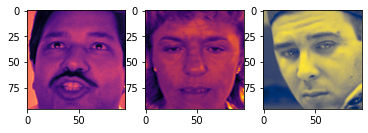

In [41]:
# lets visualize some rondom images from new column["Image_num"]

num_images = 3

plt.subplot(1, num_images, 1)
plt.imshow(X_train.at[678, "Image_num"], cmap= 'magma')

plt.subplot(1, num_images, 2)
plt.imshow(X_train.at[978, "Image_num"], cmap= 'inferno')

plt.subplot(1, num_images, 3)
plt.imshow(X_train.at[1694, "Image_num"], cmap= 'cividis')

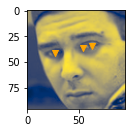

In [175]:
plt.subplot(1, num_images, 3)
plt.scatter([62.62451, 27.0215543839, 53.981], [34.1223098097, 40.7064174958, 36.236], c = 'orange', marker='v')
plt.imshow(X_train.at[1694, "Image_num"], cmap= 'cividis')

In [174]:
# X_train.at[1694, "Image_num"].shape
# (96, 96)

X_train.loc[1694]

left_eye_center_x                                                    62.624507
left_eye_center_y                                                     34.12231
right_eye_center_x                                                   27.021554
right_eye_center_y                                                   40.706417
left_eye_inner_corner_x                                              53.981172
left_eye_inner_corner_y                                              36.235727
left_eye_outer_corner_x                                              68.477047
left_eye_outer_corner_y                                              33.038506
right_eye_inner_corner_x                                             33.334711
right_eye_inner_corner_y                                             40.354181
right_eye_outer_corner_x                                             19.651689
right_eye_outer_corner_y                                             42.413408
left_eyebrow_inner_end_x                            

In [62]:
# Where are the centers of the eyes
# eye_features = ['left_eye_center_x' , 'left_eye_center_y',  'left_eye_center_x' , 'left_eye_center_y']

eyes_centers = X_train.loc[1694, ['left_eye_center_x' , 'left_eye_center_y','right_eye_center_x' , 'right_eye_center_y']]
eyes_centers.values


array([62.6245070543, 34.1223098097, 27.0215543839, 40.7064174958],
      dtype=object)

In [88]:
# We try to retieve the color of the keypoint

def find_keypoint_color(image, coor_left, coor_right):
    """
    It finds a grayscale color-point by given coordinates.

    Parameters:
    coor_left(float):  the x coordinate of the keypoint; 
    coor_left(float):  the y coordinate of the keypoint.

    Return: 
    keypoint_color(int): color of the keypoint
    """
    keypoint_color = image[round(coor_left),  round(coor_right) ]
    return keypoint_color


In [102]:
find_keypoint_color(X_train.loc[1694, 'Image_num'],27.0215543839, 40.7064174958)
# 162

# colors in the neighbor's positions:
find_keypoint_color(X_train.loc[1694, 'Image_num'],28, 40) # 179
find_keypoint_color(X_train.loc[1694, 'Image_num'],26, 40) # 174
find_keypoint_color(X_train.loc[1694, 'Image_num'],27, 41) # 162
find_keypoint_color(X_train.loc[1694, 'Image_num'],27, 39) # 186
find_keypoint_color(X_train.loc[1694, 'Image_num'],27, 38) # 190


190

Finding the positions of empty cells:

In [169]:
# X_train[X_train.left_eye_center_y.isna() & X_train.left_eye_center_x.isna()].index
# Int64Index([1687, 1834, 1866, 1938, 2100, 2137, 2153, 2175, 2186, 2239], dtype='int64')

# X_train[X_train.left_eye_center_y.isna()].index
# Int64Index([1687, 1834, 1866, 1938, 2100, 2137, 2153, 2175, 2186, 2239], dtype='int64')

# eyes_centers = ['left_eye_center_y', 'left_eye_center_x', 'right_eye_center_x', 'right_eye_center_y']
# X_train[X_train[eyes_centers].isna()] 
# 7049 rows × 32 columns
# only NaN ???

# X_train[X_train.right_eye_center_x.isna()]
# 13 rows × 32 columns

# X_train[X_train.right_eye_center_x.isna()].index
# [1620, 1643, 1687, 1834, 1866, 1912, 1938, 2090, 2095, 2099, 2137, 2153, 2186]

# X_train[X_train.right_eye_center_y.isna()]  
# 13 rows x 32 columns
# X_train[X_train.right_eye_center_y.isna()].index
# [1620, 1643, 1687, 1834, 1866, 1912, 1938, 2090, 2095, 2099, 2137, 2153, 2186]

# X_train[X_train[['right_eye_center_y', 'right_eye_center_x']].isna()]
# 7049 rows × 32 columns ??

# X_train[['right_eye_center_y', 'right_eye_center_x']].isna().sum()
# right_eye_center_y    13
# right_eye_center_x    13
# dtype: int64

# X_train[['right_eye_center_y', 'right_eye_center_x']].isna()
# 	 right_eye_center_y	right_eye_center_x
#  0	False	        False
#  1	False	        False
#  2	False	        False
#  3	False	        False
#  4	False	        False
#  ...	...	...     
#  7044	False	        False
#  7045	False	        False
#  7046	False	        False
#  7047	False	        False
#  7048	False	        False
#  7049 rows × 2 columns

X_train['right_eye_center_y']

0       36.421678
1       33.448715
2       34.909642
3       37.261774
4       38.042032
          ...    
7044    38.632942
7045    39.950198
7046    39.685042
7047    40.772339
7048    39.528604
Name: right_eye_center_y, Length: 7049, dtype: float64

In [183]:
# Dropping the NaNs
X_train_dropped = X_train.dropna()
# 2140 rows × 32 columns

In [184]:
X_train.Image_num.shape

(7049,)

In [209]:
# Defining data for modeling
X_dropped = []  
X_dropped_wrong_shape = X_train_dropped.Image_num
X_dropped_wrong_shape = np.asarray(X_dropped_wrong_shape)

X_dropped_wrong_shape.shape

(2140,)

In [210]:
(X_dropped_wrong_shape[1]).shape

(96, 96)

In [212]:
# Converting to correct shape

for i in range(len(X_dropped_wrong_shape)):
    X_dropped.append(X_dropped_wrong_shape[i].reshape(96, 96, 1))

In [222]:
X_dropped = np.reshape(X_dropped, (-1, 96,96))
X_dropped = np.asarray(X_dropped).astype('float32')

In [223]:
X_dropped.shape

(2140, 96, 96)

In [226]:
X_dropped[0]

array([[238., 236., 237., ..., 250., 250., 250.],
       [235., 238., 236., ..., 249., 250., 251.],
       [237., 236., 237., ..., 251., 251., 250.],
       ...,
       [186., 183., 181., ...,  52.,  57.,  60.],
       [189., 188., 207., ...,  61.,  69.,  78.],
       [191., 184., 184., ...,  70.,  75.,  90.]], dtype=float32)

In [232]:
X_dropped_my = X_dropped.reshape(2140, 96*96)

In [211]:
# Defining prediction target

y_dropped = []

for i in range(len(X_train_dropped)):
    y_dropped.append(np.asanyarray(X_train_dropped.iloc[i][:30]))

y_dropped = np.asarray(y_dropped).astype('float32')  

y_dropped.shape

(2140, 30)

In [228]:
y_dropped[0]

array([66.03356 , 39.002274, 30.227007, 36.421677, 59.582077, 39.647423,
       73.13035 , 39.969997, 36.35657 , 37.3894  , 23.452871, 37.3894  ,
       56.953262, 29.033648, 80.22713 , 32.228138, 40.227608, 29.002321,
       16.356379, 29.64747 , 44.42057 , 57.066803, 61.19531 , 79.97017 ,
       28.614496, 77.38899 , 43.312603, 72.935455, 43.130707, 84.48577 ],
      dtype=float32)

In [229]:
len(y_dropped[0])

30

In [233]:
rdf_clf = RandomForestClassifier(max_depth=5, random_state= 345)
rdf_clf.fit(X_dropped_my, y_dropped)

ValueError: Unknown label type: 'continuous-multioutput'

In [234]:
my_svc = SVC(C= 10)

In [ ]:
my_svc

In [146]:
X_train[X_train.right_eye_center_x.isna()].index - [0,0, 1687, 1834, 1866,0 , 1938, 2100, 2137, 2153, 2175, 2186, 2239]

Int64Index([1620, 1643, 0, 0, 0, 1912, 0, -10, -42, -54, -38, -33, -53], dtype='int64')

In [112]:
X_train.loc[1687]

left_eye_center_x                                                          NaN
left_eye_center_y                                                          NaN
right_eye_center_x                                                         NaN
right_eye_center_y                                                         NaN
left_eye_inner_corner_x                                              57.931068
left_eye_inner_corner_y                                              40.808627
left_eye_outer_corner_x                                              73.232712
left_eye_outer_corner_y                                              44.910035
right_eye_inner_corner_x                                                   NaN
right_eye_inner_corner_y                                                   NaN
right_eye_outer_corner_x                                             19.393354
right_eye_outer_corner_y                                             30.279554
left_eyebrow_inner_end_x                            

In [69]:
X_train.dtypes

left_eye_center_x            float64
left_eye_center_y            float64
right_eye_center_x           float64
right_eye_center_y           float64
left_eye_inner_corner_x      float64
left_eye_inner_corner_y      float64
left_eye_outer_corner_x      float64
left_eye_outer_corner_y      float64
right_eye_inner_corner_x     float64
right_eye_inner_corner_y     float64
right_eye_outer_corner_x     float64
right_eye_outer_corner_y     float64
left_eyebrow_inner_end_x     float64
left_eyebrow_inner_end_y     float64
left_eyebrow_outer_end_x     float64
left_eyebrow_outer_end_y     float64
right_eyebrow_inner_end_x    float64
right_eyebrow_inner_end_y    float64
right_eyebrow_outer_end_x    float64
right_eyebrow_outer_end_y    float64
nose_tip_x                   float64
nose_tip_y                   float64
mouth_left_corner_x          float64
mouth_left_corner_y          float64
mouth_right_corner_x         float64
mouth_right_corner_y         float64
mouth_center_top_lip_x       float64
m

In [81]:
from sklearn.cluster import DBSCAN

my_dbscan = DBSCAN(eps=4, min_samples=5, metric='precomputed', algorithm='auto')

# my_dbscan.fit_predict(X_train.Image_num.values)
# ValueError: setting an array element with a sequence.



ValueError: setting an array element with a sequence.

In [82]:
X_train.Image_num.values

array([array([[238, 236, 237, ..., 250, 250, 250],
              [235, 238, 236, ..., 249, 250, 251],
              [237, 236, 237, ..., 251, 251, 250],
              ...,
              [186, 183, 181, ...,  52,  57,  60],
              [189, 188, 207, ...,  61,  69,  78],
              [191, 184, 184, ...,  70,  75,  90]]),
       array([[219, 215, 204, ...,  92,  88,  84],
              [222, 219, 220, ...,  92,  88,  86],
              [231, 224, 212, ...,  77,  80,  84],
              ...,
              [  1,   1,   1, ...,   1,   1,   1],
              [  1,   1,   1, ...,   1,   1,   1],
              [  1,   1,   1, ...,   1,   1,   1]]),
       array([[144, 142, 159, ..., 208, 207, 207],
              [143, 142, 161, ..., 208, 208, 207],
              [143, 140, 160, ..., 209, 209, 207],
              ...,
              [ 66,  70,  69, ...,  81, 134, 194],
              [ 65,  69,  71, ...,  75,  83, 109],
              [ 65,  68,  70, ...,  78,  78,  77]]), ...,
       array([

In [ ]:
X_test = pd.read_csv('test.csv')
X_test.shape # (1783, 2)

X_test.head(3)

,ImageId,Image
0,1,182 183 182 182 180 180 176 169 156 137 124 10...
1,2,76 87 81 72 65 59 64 76 69 42 31 38 49 58 58 4...
2,3,177 176 174 170 169 169 168 166 166 166 161 14...


In [ ]:
id_lookup_table = pd.read_csv('IdLookupTable.csv')
id_lookup_table.shape # (27124, 4)

id_lookup_table.head(6)

,RowId,ImageId,FeatureName,Location
0,1,1,left_eye_center_x,NaN
1,2,1,left_eye_center_y,NaN
2,3,1,right_eye_center_x,NaN
3,4,1,right_eye_center_y,NaN
4,5,1,left_eye_inner_corner_x,NaN
5,6,1,left_eye_inner_corner_y,NaN


Now as we could see that a number of CSV files are read in above cells. Lets understand what each file contains.

<span style="color:darkblue">__*Training File:*__</span>

**training.csv:** This file contains training data. Last column of this file named Image contains image data. Rest of the columns ends <kbd>_x</kbd> or <kbd>_y</kbd> coordinate values values for different keypoints. E.g.: First two columns *left_eye_center_x*, *left_eye_center_y* denote $x$ and $y$ coordinates of center point of *left eye*.

Also, column Image contains image as a string of numbers, separated by spaces. Later in this notebook we will convert this image to 2D numpy array so that we could process it as actual image.

<span style="color:darkblue">__*Testing Files:*__</span>

Rest of the files will be used to make submissions. Lets understand each one in detail:

**test.csv:** This file contains only two columns ImageId, Image. Again, here also image is represented as string of numbers that will be later converted to 2D numpy arrays. We need to make predictions of keypoints for each image present in this file.

**IdLookupTable.csv:** For each image in test we do not need to predict all keypoints. What keypoints are required for each image are mentioned in this file. This file has got 4 columns: *RowId*, *ImageId*, *FeatureName*, *Location*. So we need to extract Location for specific FeatureName for each ImageId.

**SampleSubmission.csv:** This is a final submission file into a kaggle-competition. We'll not use it for our project work.


In [47]:
pd.read_csv('IdLookupTable.csv')

,RowId,ImageId,FeatureName,Location
0,1,1,left_eye_center_x,NaN
1,2,1,left_eye_center_y,NaN
2,3,1,right_eye_center_x,NaN
3,4,1,right_eye_center_y,NaN
4,5,1,left_eye_inner_corner_x,NaN
...,...,...,...,...
27119,27120,1783,right_eye_center_y,NaN
27120,27121,1783,nose_tip_x,NaN
27121,27122,1783,nose_tip_y,NaN
27122,27123,1783,mouth_center_bottom_lip_x,NaN


### 1.3. Checking empty cells 

### Create Features and Labels for Training Model

In [49]:
#Create list of feature and labels
images = []
labels = []

for i, sample in X_train.iterrows():
    #Features
    img = np.array((sample['Image'].split(' ')), dtype=float)
    img = np.reshape(img, (96, 96, 1))
    images.append(img)
    #Labels
    labels.append(sample[0:30])    

In [53]:
labels[0]

left_eye_center_x            66.033564
left_eye_center_y            39.002274
right_eye_center_x           30.227008
right_eye_center_y           36.421678
left_eye_inner_corner_x      59.582075
left_eye_inner_corner_y      39.647423
left_eye_outer_corner_x      73.130346
left_eye_outer_corner_y      39.969997
right_eye_inner_corner_x     36.356571
right_eye_inner_corner_y     37.389402
right_eye_outer_corner_x     23.452872
right_eye_outer_corner_y     37.389402
left_eyebrow_inner_end_x     56.953263
left_eyebrow_inner_end_y     29.033648
left_eyebrow_outer_end_x     80.227128
left_eyebrow_outer_end_y     32.228138
right_eyebrow_inner_end_x    40.227609
right_eyebrow_inner_end_y    29.002322
right_eyebrow_outer_end_x    16.356379
right_eyebrow_outer_end_y    29.647471
nose_tip_x                   44.420571
nose_tip_y                   57.066803
mouth_left_corner_x          61.195308
mouth_left_corner_y          79.970165
mouth_right_corner_x         28.614496
mouth_right_corner_y     

In [247]:
nx, ny, nz = (3,5, 1)       #       (array([[[0. , 0. ],
                            #                [0.5, 0.5],
                            #                [1. , 1. ]],
                            #       
                            #               [[0. , 0. ],
                            #                [0.5, 0.5],
                            #                [1. , 1. ]],
                            #       
                            #               [[0. , 0. ],
                            #                [0.5, 0.5],
                            #                [1. , 1. ]],
                            #       
                            #               [[0. , 0. ],
                            #                [0.5, 0.5],
                            #                [1. , 1. ]],
                            #       
                            #               [[0. , 0. ],
                            #                [0.5, 0.5],
                            #                [1. , 1. ]]]),)
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
z = np.linspace(0, 1, nz)
xv, yv, zv = np.meshgrid(x, y, z)

# x, y,z, print('\n') 
# xv, # 
yv, 
# zv

(array([[[0.  , 0.  ],
         [0.  , 0.  ],
         [0.  , 0.  ]],
 
        [[0.25, 0.25],
         [0.25, 0.25],
         [0.25, 0.25]],
 
        [[0.5 , 0.5 ],
         [0.5 , 0.5 ],
         [0.5 , 0.5 ]],
 
        [[0.75, 0.75],
         [0.75, 0.75],
         [0.75, 0.75]],
 
        [[1.  , 1.  ],
         [1.  , 1.  ],
         [1.  , 1.  ]]]),)

In [248]:
zv

array([[[0., 1.],
        [0., 1.],
        [0., 1.]],

       [[0., 1.],
        [0., 1.],
        [0., 1.]],

       [[0., 1.],
        [0., 1.],
        [0., 1.]],

       [[0., 1.],
        [0., 1.],
        [0., 1.]],

       [[0., 1.],
        [0., 1.],
        [0., 1.]]])